In [28]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

import ipywidgets as widgets
from ipywidgets import interact

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from anomaly_detectors import detect_freeze

sns.set(style="whitegrid", context="notebook", rc={"figure.figsize":(14,10)})

In [29]:
dataset_train = pd.read_csv(os.path.join("data", "train.csv"), low_memory=False)
dataset_train["Datum_Uhrzeit_CET"] = pd.to_datetime(dataset_train["Datum_Uhrzeit_CET"], errors="coerce")

dataset_test = pd.read_csv(os.path.join("data", "test.csv"), low_memory=False)
dataset_test["Datum_Uhrzeit_CET"] = pd.to_datetime(dataset_test["Datum_Uhrzeit_CET"], errors="coerce")

In [32]:
dataset_test

,id,Datum_Uhrzeit_CET,Demand,correction,correctedDemand,FRCE,controlBandPos,controlBandNeg,LFCInput,aFRRactivation,aFRRrequest,participationCMO,participationIN,correctionEcho,BandLimitedCorrectedDemand,controlArea,test_data_segment_id
0,0,2023-05-13 00:13:08,-570.910,0.000,-570.91000,-404.48600,154,-166.0,-438.5320,-166.414000,-166.000000,1.0,1.0,0.000,-166.00000,1,0
1,1,2023-05-13 00:13:12,-578.061,0.000,-578.06100,-411.71500,154,-166.0,-437.6280,-166.345000,-166.000000,1.0,1.0,0.000,-166.00000,1,0
2,2,2023-05-13 00:13:16,-586.085,0.000,-586.08500,-419.69500,154,-166.0,-433.7740,-166.385000,-166.000000,1.0,1.0,0.000,-166.00000,1,0
3,3,2023-05-13 00:13:20,-561.229,0.000,-561.22900,-395.21300,154,-166.0,-430.7980,-166.007000,-166.000000,1.0,1.0,0.000,-166.00000,1,0
4,4,2023-05-13 00:13:24,-580.140,0.000,-580.14000,-414.71800,154,-166.0,-428.6420,-165.412000,-166.000000,1.0,1.0,0.000,-166.00000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37795,37795,2023-05-03 12:28:20,102.801,-108.801,-6.00000,-11.86230,219,-280.0,102.6170,1.491960,1.683590,1.0,1.0,-94.271,-6.00000,2,104
37796,37796,2023-05-03 12:28:24,108.521,-116.451,-7.92983,-9.85042,219,-280.0,102.2570,0.087961,1.669670,1.0,1.0,-108.801,-7.92983,2,104
37797,37797,2023-05-03 12:28:28,81.251,-87.251,-6.00000,-9.53678,219,-280.0,90.5791,0.556173,-4.206030,1.0,1.0,-116.451,-6.00000,2,104
37798,37798,2023-05-03 12:28:32,99.071,-113.512,-14.44110,-10.49720,219,-280.0,81.0233,0.558001,0.717892,1.0,1.0,-87.251,-14.44110,2,104


In [4]:
NUM_STEPS_THRESHOLD = 30000

for control_area in [1, 2]:
    area_subset_train = dataset_train[dataset_train["controlArea"] == control_area][:NUM_STEPS_THRESHOLD]

In [37]:
features = [
    ["Demand", 10],
    ["correction",10] ,
    ["correctionEcho",10], 
    ["correctedDemand",10], 
    ["FRCE",10], 
    ["controlBandPos",10], 
    ["controlBandNeg",10], 
    ["LFCInput",10], 
    ["aFRRactivation",10], 
    ["aFRRrequest",5], 
    ["participationCMO",10], 
    ["participationIN",10], 
    ["BandLimitedCorrectedDemand",10],
]

for feature in features:
    area_subset_train.loc[:, feature[0]+'_frozen'] = detect_freeze(area_subset_train, feature[0], min_duration=feature[1])

In [56]:


# Calculate the moving average
area_subset_train['aFRRrequest_mavg'] = area_subset_train['aFRRrequest'].rolling(window=5).mean()

area_subset_train['aFRRactivation_mavg'] = area_subset_train['aFRRactivation'].rolling(window=5).mean()


In [ ]:
def detect_async(dataset, signalname: str, min_duration: float, threshold: float = 0.001) -> pd.Series:
    """
    Detect periods where the signal is 'frozen'.

    :param signal: Pandas Series representing the signal.
    :param threshold: Threshold for determining if the signal is frozen.
    :param min_duration: Minimum duration (in number of data points) for the signal to be considered frozen.
    :return: Pandas Series of booleans indicating frozen periods.
    """
    diff = dataset[signalname].diff().abs()
    below_threshold = diff < threshold  

    # Initialize a series to store the results
    frozen_periods = pd.Series(False, index=dataset.index)

    # Check for periods where the signal remains below the threshold for at least 'min_duration'
    frozen_endpoints = below_threshold.rolling(window=min_duration).sum() >= min_duration
    for endpoint_index in frozen_endpoints[frozen_endpoints == True].index:
        frozen_periods[endpoint_index-min_duration+1:endpoint_index+1] = True
    return frozen_periods

In [60]:
np.abs(area_subset_train['aFRRrequest_mavg'] - area_subset_train['aFRRactivation'].shift(-8))

0              NaN
2              NaN
4              NaN
6              NaN
8        24.894283
           ...    
59991          NaN
59993          NaN
59995          NaN
59996          NaN
59999          NaN
Length: 30000, dtype: float64

In [63]:
window_size = "30s" #odd

def center_subtract(window):
    middle_index = window.index[int(len(window)/2)]
    reference_activation = time_indexed_train.loc[middle_index]["aFRRactivation"]
    std = np.sqrt(np.square(window - reference_activation).mean())
    return std

time_indexed_train = area_subset_train.set_index("Datum_Uhrzeit_CET")
dispersion = time_indexed_train["aFRRrequest"].rolling(window_size, center=True).apply(center_subtract).rename("affr_dispersion")


In [66]:
area_subset_train.columns

Index(['id', 'Datum_Uhrzeit_CET', 'Demand', 'correction', 'correctedDemand',
       'FRCE', 'controlBandPos', 'controlBandNeg', 'LFCInput',
       'aFRRactivation', 'aFRRrequest', 'participationCMO', 'participationIN',
       'correctionEcho', 'BandLimitedCorrectedDemand', 'controlArea',
       'aFRRrequest_mavg', 'aFRRactivation_mavg', 'Demand_frozen',
       'correction_frozen', 'correctionEcho_frozen', 'correctedDemand_frozen',
       'FRCE_frozen', 'controlBandPos_frozen', 'controlBandNeg_frozen',
       'LFCInput_frozen', 'aFRRactivation_frozen', 'aFRRrequest_frozen',
       'participationCMO_frozen', 'participationIN_frozen',
       'BandLimitedCorrectedDemand_frozen'],
      dtype='object')

In [67]:
dataset_test.columns

Index(['id', 'Datum_Uhrzeit_CET', 'Demand', 'correction', 'correctedDemand',
       'FRCE', 'controlBandPos', 'controlBandNeg', 'LFCInput',
       'aFRRactivation', 'aFRRrequest', 'participationCMO', 'participationIN',
       'correctionEcho', 'BandLimitedCorrectedDemand', 'controlArea',
       'test_data_segment_id'],
      dtype='object')

In [65]:
fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", y="aFRRrequest_mavg", title="aFRRrequest")
fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
                     y=area_subset_train['aFRRactivation'].shift(-8), 
                     mode='lines', name='aFRRactivation'))
fig.show()

fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", 
              y=np.abs(area_subset_train['aFRRrequest_mavg'] - area_subset_train['aFRRactivation'].shift(-8)), 
              title="aFRRrequest")
fig.show()
fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", 
              y=dispersion, 
              title="aFRRrequest")

fig.show()

In [48]:
#slice = area_subset_train[]

fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", y="aFRRrequest", title="aFRRrequest")
#fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
#                     y=area_subset_train['aFRRactivation'], 
#                     mode='lines', name='aFRRactivation'))
#fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
#                     y=area_subset_train['aFRRrequest_mavg'], 
#                     mode='lines', name='aFRRrequest_mavg'))
fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
                     y=area_subset_train['aFRRrequest_mavg'], 
                     mode='lines', name='aFRRrequest_mavg'))
fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
                     y=area_subset_train['aFRRactivation'], 
                     mode='lines', name='aFRRactivation'))
fig.show()

#diff = area_subset_train['aFRRrequest_mavg'].diff().abs()
#fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", 
#              y=np.abs(area_subset_train['aFRRrequest_mavg']-area_subset_train['aFRRactivation_mavg']), 
#              title="aFRRrequest_minus_activation")
#fig.show()

aFRRrequest_mavg_diff = area_subset_train['aFRRrequest_mavg'].diff()
aFRRactivation_diff = area_subset_train['aFRRactivation'].diff()
aFRRactivation_mavg_diff = area_subset_train['aFRRactivation_mavg'].diff(2)
fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", 
              y=aFRRrequest_mavg_diff, 
              title="aFRRrequest_mavg_diff")
fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
                     y=aFRRactivation_mavg_diff, 
                     mode='lines', name='aFRRactivation_mavg_diff'))
fig.show()

0


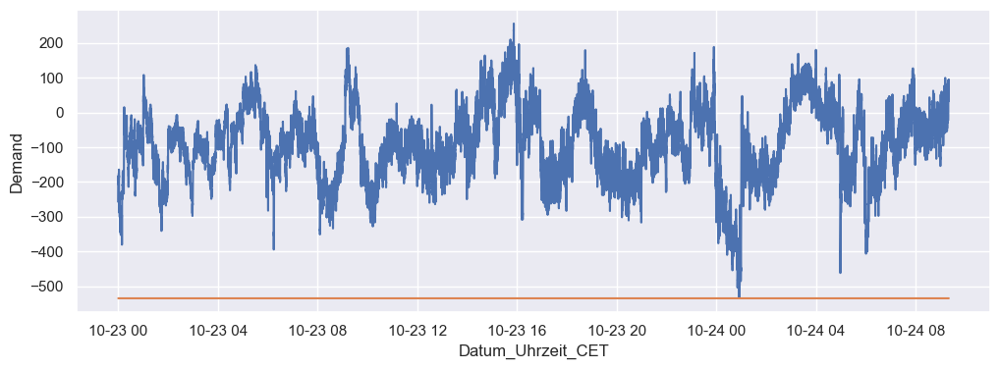

1


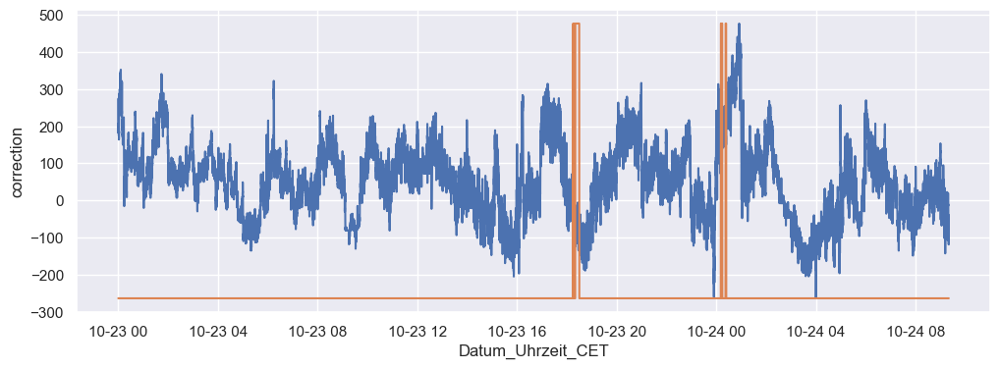

2


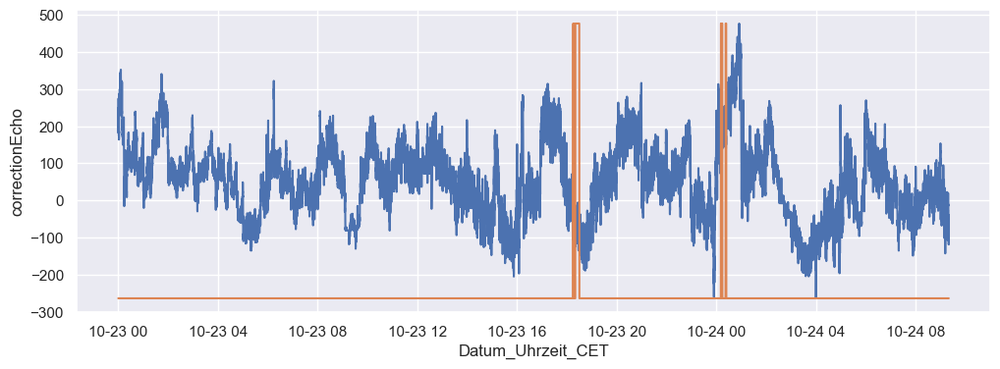

3


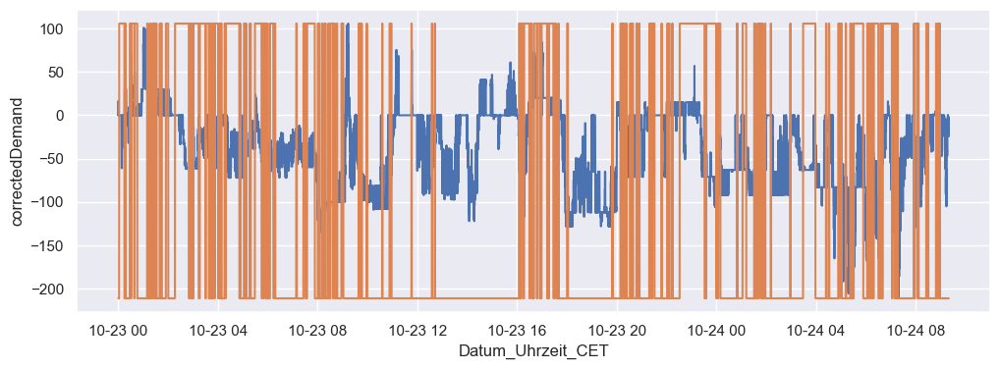

4


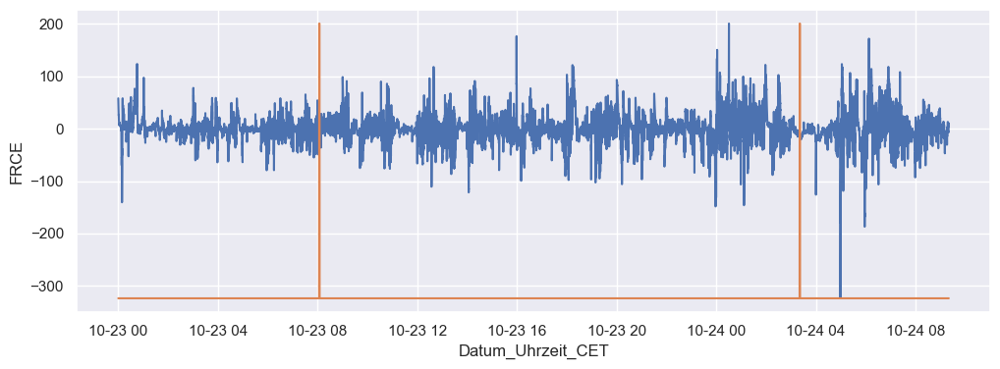

5


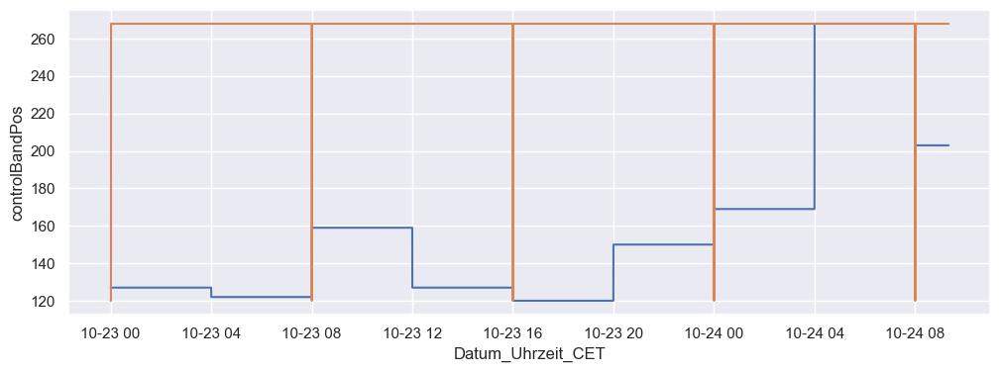

6


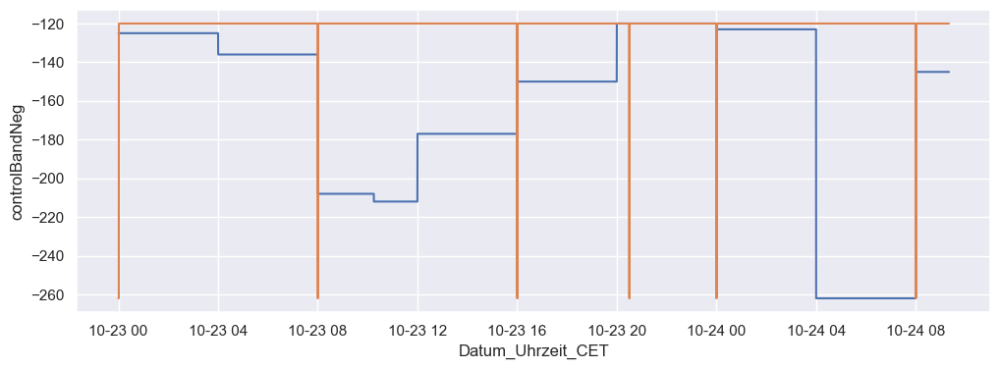

7


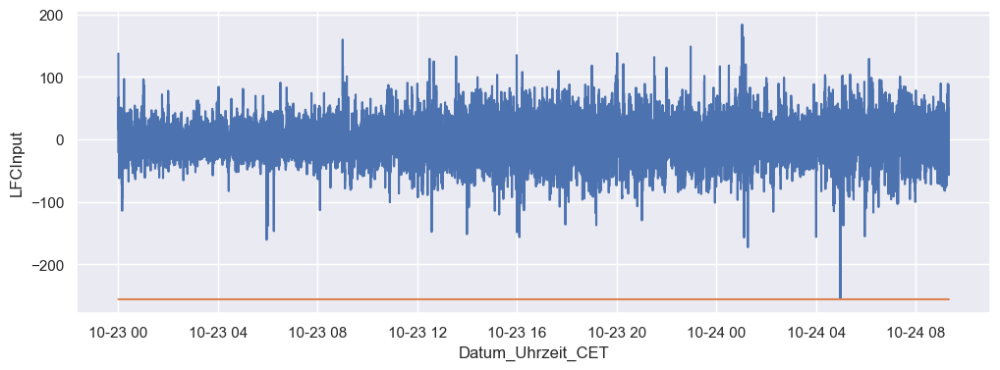

8


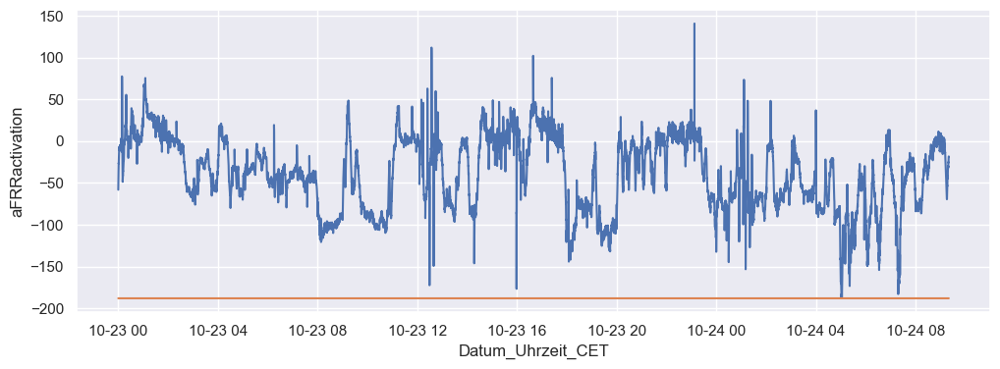

9


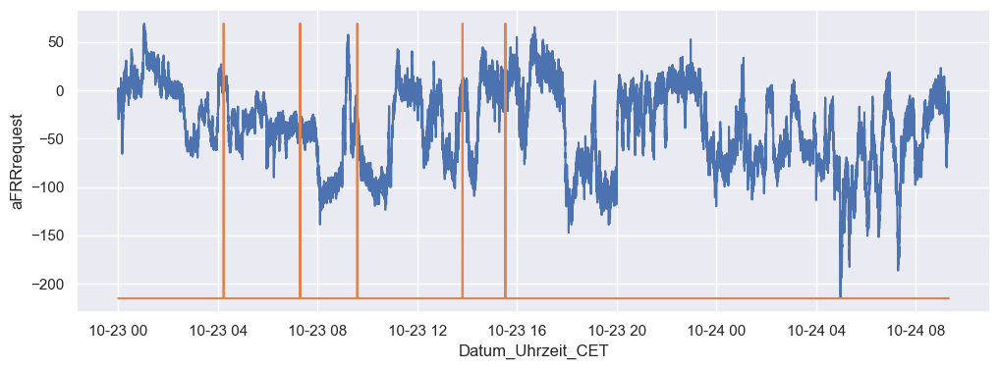

10


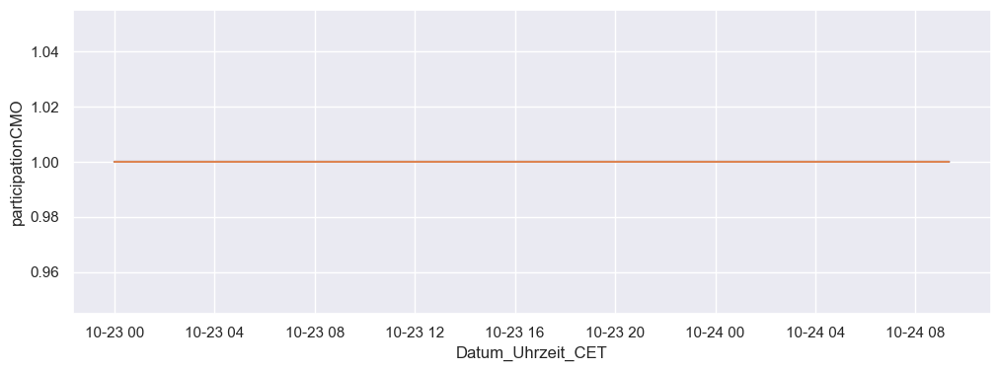

11


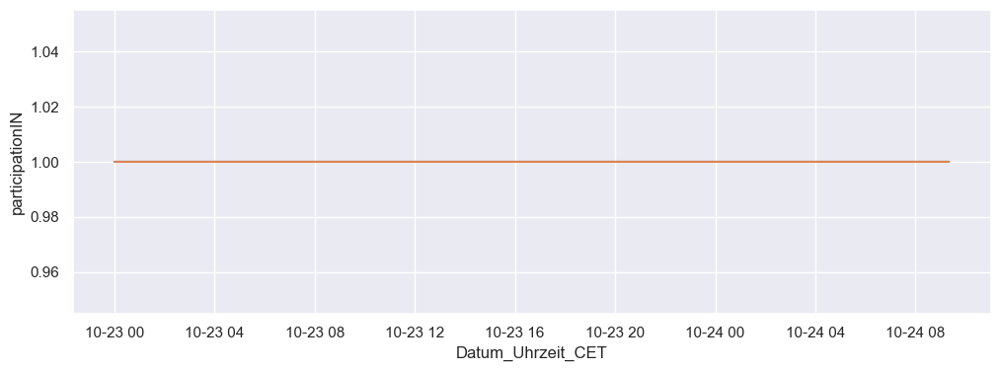

12


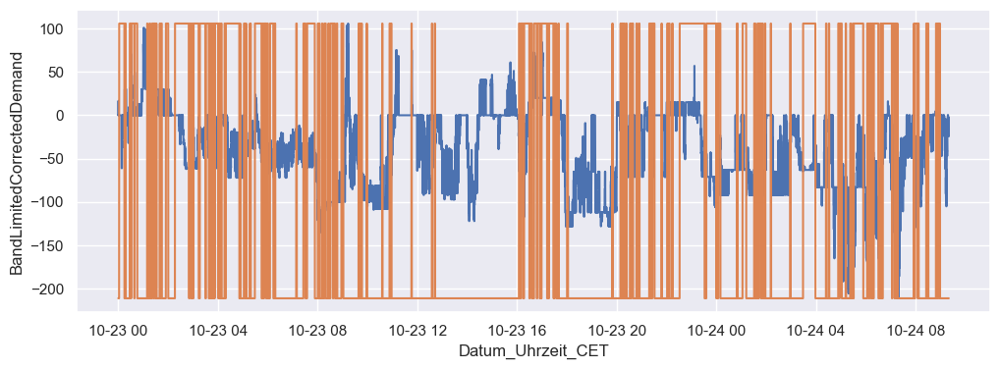

In [7]:

# Create subplots with shared x-axis
#fig = make_subplots(rows=len(features), shared_xaxes=True, vertical_spacing=1 / (len(features) - 1))

sns.set(rc={'figure.figsize': (12, 4)})

for i, feature in enumerate(features):
    print(i)
    fig, ax = plt.subplots()
    sns.lineplot(x="Datum_Uhrzeit_CET", y=feature[0], data=area_subset_train, ax=ax)
    
    #fig = px.line(area_subset_train, x="Datum_Uhrzeit_CET", y=feature, title=feature)
    # fig.add_trace(go.Scatter(x=area_subset_train["Datum_Uhrzeit_CET"], 
    #                 y=area_subset_train[feature], 
    #                 mode='lines', name=feature),                     
    #                 row=i+1, col=1)
    
    y_min = np.min(area_subset_train[feature[0]])
    y_max = np.max(area_subset_train[feature[0]])
    bool_signal_plot_y = np.where(area_subset_train[feature[0]+'_frozen'], 
                                  y_max, y_min)
    sns.lineplot(x="Datum_Uhrzeit_CET", y=bool_signal_plot_y, 
                 data=area_subset_train, 
                 ax=ax)
    # bool_plot = go.Scatter(x=area_subset_train['Datum_Uhrzeit_CET'], 
    #                        y=bool_signal_plot_y, 
    #                         fill='tozeroy', 
    #                         mode='none', name='Boolean Signal',
    #                         fillcolor='rgba(255, 0, 0, 0.5)') 
    # fig.add_trace(bool_plot)#, row=i+1, col=1)
    # fig.show()
    plt.show()



In [ ]:
# def plot_freeze(fig, frozen: pd.Series):   
#     for i in range(len(frozen)):
#         if frozen.iloc[i]:
#             # Find the start and end of the frozen period
#             start = frozen.index[i]
#             while i < len(frozen) and frozen[i]:
#                 i += 1
#             end = frozen.index[i - 1]

            # Add a filled area for this frozen period
            # traces.append(go.Scatter(x=[start, end, end, start, start], 
            #                          y=[0, 0, signal.max(), signal.max(), 0], 
            #                          fill='toself', 
            #                          fillcolor='red', 
            #                          opacity=0.2, 
            #                          line=dict(color='transparent'),
            #                          showlegend=False))
